# IMPORTANT: Indonesian Addresses

### Components
To get useful insights from the visualization below, these are the components in an Indonesian address.
   
From the highest to the lowest:
* **Provinsi** — Province
* **Kota** or **Kabupaten** — Regency
* **Kecamatan** — District
* **Kelurahan** or **Desa** — Village
* **RW**, an abbrev. of Rukun Warga (Neighborhood Unit)
* **RT**, an abbrev. of Rukun Tetangga (Community Unit)

The last two are subdivisions of a Village and normally use numbers.

### Example
Gang Werkudara Nomor 34 RT 04 RW 08 Sokaraja Kulon, Sokaraja, Banyumas, Jawa Tengah
* Gang Werkudara — street name (alley)
* RT 04, RW 08 — as explained above
* Sokaraja Kulon — Village
* Sokaraja — District
* Banyumas— Regency
* Jawa Tengah — Province

### Common Abbreviation
* gg/gg./gang refers to an alley
* jl/jln/jalan/jl./jln. refers to Jalan (street)
* no./nomor/no refers to number
* kec./kecamatan/kec refers to Kecamatan
* kel./kelurahan/kel refers to Kelurahan
* kab./kabupaten/kab refers to Kabupaten

# 1. Data Preparation

### Import Libraries

In [1]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

!pip install chart_studio
!pip install textstat

import numpy as np 
import pandas as pd

# Visualization 
import matplotlib.pyplot as plt
import chart_studio.plotly as py
import plotly.figure_factory as ff
import plotly.graph_objects as go
from plotly.offline import iplot
import cufflinks
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')
import seaborn as sns
%matplotlib inline

# Word Cloud
from wordcloud import WordCloud

# sklearn 
from sklearn.feature_extraction.text import CountVectorizer

# Pandas Profiling
from pandas_profiling import ProfileReport

# Suppress warnings 
import warnings
warnings.filterwarnings('ignore')

     |████████████████████████████████| 64 kB 529 kB/s 
     |████████████████████████████████| 99 kB 747 kB/s 
     |████████████████████████████████| 1.9 MB 2.8 MB/s 


### Dataset Preparation

In [2]:
df = pd.read_csv("train.csv")
validation = pd.read_csv("test.csv")

In [3]:
df.head()

,id,raw_address,POI/street
0,0,jl kapuk timur delta sili iii lippo cika 11 a ...,/jl kapuk timur delta sili iii lippo cika
1,1,"aye, jati sampurna",/
2,2,setu siung 119 rt 5 1 13880 cipayung,/siung
3,3,"toko dita, kertosono",toko dita/
4,4,jl. orde baru,/jl. orde baru


In [4]:
validation.head()

,id,raw_address
0,0,s. par 53 sidanegara 4 cilacap tengah
1,1,"angg per, baloi indah kel. lubuk baja"
2,2,"asma laun, mand imog,"
3,3,"ud agung rej, raya nga sri wedari karanganyar"
4,4,"cut mutia, 35 baiturrahman"


# 2. Basic Data Exploration

### Extract POI and Street

In [5]:
df[['POI', 'street']] = df['POI/street'].str.split('/', 1, expand=True)
df['POI/street'].replace('/', np.nan, inplace=True)
df['POI'].replace('', np.nan, inplace=True)
df['street'].replace('', np.nan, inplace=True)
df.head()

,id,raw_address,POI/street,POI,street
0,0,jl kapuk timur delta sili iii lippo cika 11 a ...,/jl kapuk timur delta sili iii lippo cika,NaN,jl kapuk timur delta sili iii lippo cika
1,1,"aye, jati sampurna",NaN,NaN,NaN
2,2,setu siung 119 rt 5 1 13880 cipayung,/siung,NaN,siung
3,3,"toko dita, kertosono",toko dita/,toko dita,NaN
4,4,jl. orde baru,/jl. orde baru,NaN,jl. orde baru


### Missing Values
Replace all '/' or empty strings with NaN and then count all of the missing values in the training set.

In [6]:
def missing_value_of_data(data):
    total = data.isnull().sum().sort_values(ascending=False)
    percentage = round(total/data.shape[0]*100,2)
    return pd.concat([total,percentage], axis=1, keys=['Total','Percentage'])

In [7]:
missing_value_of_data(df)

,Total,Percentage
POI,178509,59.50
street,70143,23.38
POI/street,31993,10.66
id,0,0.00
raw_address,0,0.00


### Duplicate Values

In [8]:
def duplicated_values_data(data):
    dup=[]
    columns=data.columns
    for i in data.columns:
        dup.append(sum(data[i].duplicated()))
    return pd.concat([pd.Series(columns),pd.Series(dup)],axis=1,keys=['Columns','Duplicate count'])

In [9]:
df_cleaned = df.dropna()
duplicated_values_data(df_cleaned)

,Columns,Duplicate count
0,id,0
1,raw_address,0
2,POI/street,4065
3,POI,12422
4,street,50254


# 3. Semantic Analysis
Take a look at the different punctuation in addresses.

In [11]:
qmarks = np.mean(df['raw_address'].apply(lambda x: '?' in x))
fullstop = np.mean(df['raw_address'].apply(lambda x: '.' in x))
comma = np.mean(df['raw_address'].apply(lambda x: ',' in x))
capital_first = np.mean(df['raw_address'].apply(lambda x: x[0].isupper()))
capitals = np.mean(df['raw_address'].apply(lambda x: max([y.isupper() for y in x])))
numbers = np.mean(df['raw_address'].apply(lambda x: max([y.isdigit() for y in x])))

print('Address with question marks: {:.2f}%'.format(qmarks * 100))
print('Address with full stops: {:.2f}%'.format(fullstop * 100))
print('Address with comma: {:.2f}%'.format(comma * 100))
print('Address with capital letters: {:.2f}%'.format(capitals * 100))
print('Address with numbers: {:.2f}%'.format(numbers * 100))

Address with question marks: 0.01%
Address with full stops: 19.77%
Address with comma: 50.68%
Address with capital letters: 0.00%
Address with numbers: 59.32%


# 4. Text Length Analysis
Calculate the number of words in each address and look at the length distribution.

In [12]:
lens = df.raw_address.str.split().apply(lambda x: len(x))
print(lens.describe())

count    300000.000000
mean          6.842183
std           2.827218
min           1.000000
25%           5.000000
50%           6.000000
75%           9.000000
max          32.000000
Name: raw_address, dtype: float64


Results of this calculation establish that text length is short (average length of 7 words).

In [13]:
df['text_len'] = df['raw_address'].astype(str).apply(len)
df['text_word_count'] = df['raw_address'].apply(lambda x: len(str(x).split()))
df.head()

,id,raw_address,POI/street,POI,street,text_len,text_word_count
0,0,jl kapuk timur delta sili iii lippo cika 11 a ...,/jl kapuk timur delta sili iii lippo cika,NaN,jl kapuk timur delta sili iii lippo cika,66,13
1,1,"aye, jati sampurna",NaN,NaN,NaN,18,3
2,2,setu siung 119 rt 5 1 13880 cipayung,/siung,NaN,siung,36,8
3,3,"toko dita, kertosono",toko dita/,toko dita,NaN,20,3
4,4,jl. orde baru,/jl. orde baru,NaN,jl. orde baru,13,3


### Text Length Distribution

In [14]:
df['text_len'].iplot(
    kind='hist',
    bins=100,
    xTitle='text length',
    linecolor='black',
    color='red',
    yTitle='count',
    title='Text Length Distribution')

### Text Word Count

In [15]:
df['text_word_count'].iplot(
    kind='hist',
    bins=50,
    xTitle='text length',
    linecolor='black',
    color='red',
    yTitle='count',
    title='Text word count')

### Comparing Training and Validation Data

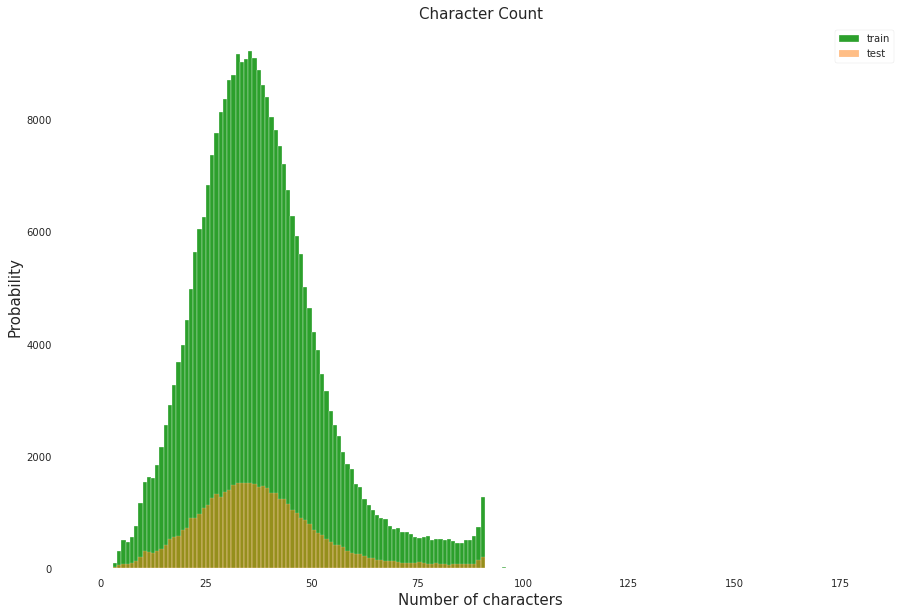

In [16]:
pal = sns.color_palette()
train = df['raw_address'].apply(len)
valid = validation['raw_address'].apply(len)

plt.figure(figsize=(15, 10))
plt.hist(train, bins=180, range=[0, 180], color=pal[2], label='train')
plt.hist(valid, bins=180, range=[0, 180], color=pal[1], alpha=0.5, label='test')
plt.title('Character Count', fontsize=15)
plt.legend()
plt.xlabel('Number of characters', fontsize=15)
plt.ylabel('Probability', fontsize=15);

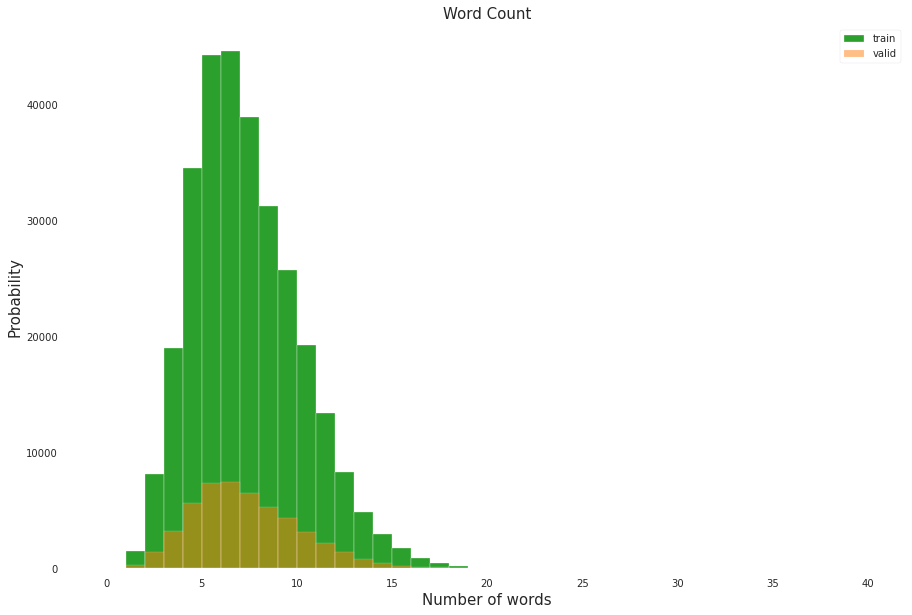

In [17]:
train = df['raw_address'].apply(lambda x: len(x.split(' ')))
valid = validation['raw_address'].apply(lambda x: len(x.split(' ')))

plt.figure(figsize=(15, 10))
plt.hist(train, bins=40, range=[0, 40], color=pal[2], label='train')
plt.hist(valid, bins=40, range=[0, 40], color=pal[1], alpha=0.5, label='valid')
plt.title('Word Count', fontsize=15)
plt.legend()
plt.xlabel('Number of words', fontsize=15)
plt.ylabel('Probability', fontsize=15);

# 5. Top Unigram Distribution

In [18]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer().fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

In [19]:
unigrams = get_top_n_words(df['raw_address'], 20)
df1 = pd.DataFrame(unigrams, columns = ['Text', 'count'])

df1.groupby('Text').sum()['count'].sort_values(ascending=True).iplot(
    kind='bar', xTitle='Count', linecolor='black',color='red', title='Top 20 Unigrams (Raw Address)',orientation='h')

In [20]:
df_cleaned = df.dropna()
unigrams = get_top_n_words(df_cleaned['POI'], 20)
df2 = pd.DataFrame(unigrams, columns = ['Text', 'count'])

df2.groupby('Text').sum()['count'].sort_values(ascending=True).iplot(
    kind='bar', xTitle='Count', linecolor='black',color='red', title='Top 20 Unigrams (POI)',orientation='h')

In [21]:
unigrams = get_top_n_words(df_cleaned['street'], 20)
df2 = pd.DataFrame(unigrams, columns = ['Text', 'count'])

df2.groupby('Text').sum()['count'].sort_values(ascending=True).iplot(
    kind='bar', xTitle='Count', linecolor='black',color='red', title='Top 20 Unigrams (street)',orientation='h')

# 6. Top Bigram Distribution

In [22]:
def get_top_n_gram(corpus,ngram_range,n=None):
    vec = CountVectorizer(ngram_range=ngram_range).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

In [23]:
bigrams = get_top_n_gram(df['raw_address'],(2,2),20)
df1 = pd.DataFrame(bigrams, columns = ['Text', 'count'])

df1.groupby('Text').sum()['count'].sort_values(ascending=True).iplot(
    kind='bar', xTitle='Count', linecolor='black',color='red', title='Top 20 Bigrams (raw_street)',orientation='h')

In [24]:
bigrams = get_top_n_gram(df_cleaned['POI'],(2,2),20)
df2 = pd.DataFrame(bigrams, columns = ['Text', 'count'])

df2.groupby('Text').sum()['count'].sort_values(ascending=True).iplot(
    kind='bar', xTitle='Count', linecolor='black',color='red', title='Top 20 Bigrams (POI)',orientation='h')

In [25]:
bigrams = get_top_n_gram(df_cleaned['street'],(2,2),20)
df3 = pd.DataFrame(bigrams, columns = ['Text', 'count'])

df3.groupby('Text').sum()['count'].sort_values(ascending=True).iplot(
    kind='bar', xTitle='Count', linecolor='black',color='red', title='Top 20 Bigrams (street)',orientation='h')

# 7. Top Trigram Distribution

In [26]:
trigrams = get_top_n_gram(df['raw_address'],(3,3),20)
df1 = pd.DataFrame(trigrams, columns = ['Text' , 'count'])

df1.groupby('Text').sum()['count'].sort_values(ascending=True).iplot(
    kind='bar', xTitle='Count', linecolor='black',color='red', title='Top 20 Trigrams (raw_address)',orientation='h')

In [27]:
trigrams = get_top_n_gram(df_cleaned['POI'],(3,3),20)
df2 = pd.DataFrame(trigrams, columns = ['Text' , 'count'])
df2.groupby('Text').sum()['count'].sort_values(ascending=True).iplot(
    kind='bar', xTitle='Count', linecolor='black',color='red', title='Top 20 Trigrams (POI)',orientation='h')

In [28]:
trigrams = get_top_n_gram(df_cleaned['street'],(3,3),20)
df3 = pd.DataFrame(trigrams, columns = ['Text' , 'count'])

df3.groupby('Text').sum()['count'].sort_values(ascending=True).iplot(
    kind='bar', xTitle='Count', linecolor='black',color='red', title='Top 20 Trigrams (street)',orientation='h')

# 8. Most Common Words

In [29]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer().fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

In [30]:
top_words = get_top_n_words(df['raw_address'])
x = [x[0] for x in top_words[:30]]
y = [x[1] for x in top_words[:30]]

In [31]:
fig = go.Figure([go.Bar(x=x, y=y, text=y)])
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide', title_text='Most Common Words')

# 9. Word Cloud

In [32]:
def plot_cloud(wordcloud):
    plt.figure(figsize=(10, 8)) # set figure size
    plt.imshow(wordcloud) # display image
    plt.axis("off"); # no axis details

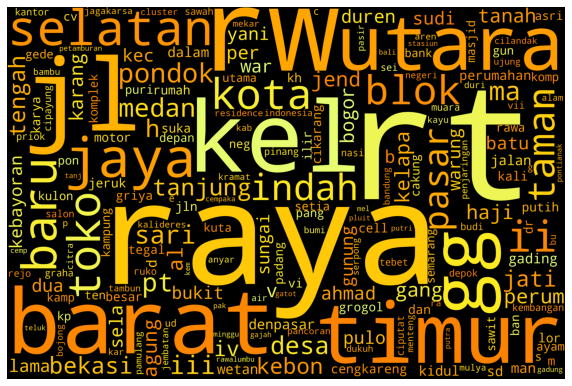

In [33]:
wordcloud = WordCloud(width = 3000, 
                      height = 2000,
                      random_state=1, 
                      background_color='black', 
                      colormap='Wistia', 
                      collocations=False).generate(" ".join(df['raw_address']))

plot_cloud(wordcloud)